In [10]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd

In [136]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



**Import the datasets**

In [11]:
train=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/train_s3TEQDk.csv',index_col=0)
test=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/test_mSzZ8RL.csv',index_col=0)
sub=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/sample_submission_eyYijxG.csv')

**Perform Descriptive Statistics**

In [41]:
#Check the train set variables
print(train.dtypes)
print(train.shape)
print(train.describe(include='all'))

Gender                 object
Age                     int64
Region_Code            object
Occupation             object
Channel_Code           object
Vintage                 int64
Credit_Product         object
Avg_Account_Balance     int64
Is_Active              object
Is_Lead                 int64
dtype: object
(245725, 10)
        Gender            Age  ... Is_Active        Is_Lead
count   245725  245725.000000  ...    245725  245725.000000
unique       2            NaN  ...         2            NaN
top       Male            NaN  ...        No            NaN
freq    134197            NaN  ...    150290            NaN
mean       NaN      43.856307  ...       NaN       0.237208
std        NaN      14.828672  ...       NaN       0.425372
min        NaN      23.000000  ...       NaN       0.000000
25%        NaN      30.000000  ...       NaN       0.000000
50%        NaN      43.000000  ...       NaN       0.000000
75%        NaN      54.000000  ...       NaN       0.000000
max        Na

Thr variables in the training data consists of both qualitative as well as quantitative variables. For the qualitative variables, the unique values are 2,35,4,4,2,2 respectively for Gender, Region_Code, Occupation, Channel_Code, Credit_Product and Is_Active. For the quantitative variable Age the mean and the median are equal thus innitially seggesting that there are no outliers. Also for the variable Vintage the mean and the median are almost same while the variable Avg_Account_Balance is a matter of concern as it seems like it contains outliers. Further we'll visialize these variables to get a broader picture.

In [42]:
#Check the test set variables
print(test.dtypes)
print(test.shape)

Gender                 object
Age                     int64
Region_Code            object
Occupation             object
Channel_Code           object
Vintage                 int64
Credit_Product         object
Avg_Account_Balance     int64
Is_Active              object
dtype: object
(105312, 9)


In [76]:
#Check if there are missing values in the target variable if true then drop them
print(train['Is_Lead'].isna().sum()/len(train))
train=train.dropna(axis=0,subset=['Is_Lead'])

0.0


There are no missing values in the dependent variable.

**Divide the train set in X and y**

In [139]:
y=train[['Is_Lead']]
X=train.drop(['Is_Lead'],axis=1)
print(X.shape)

(245725, 9)


In [78]:
print(type(y))

<class 'pandas.core.frame.DataFrame'>


In [79]:
#Check if the column names of train and test set are equal or not
train_cols=X.columns
#train_cols=train.columns
test_cols=test.columns
common_cols=train_cols.intersection(test_cols)
diff_cols=train_cols.difference(test_cols)
print(diff_cols)

Index([], dtype='object')


Clearly the column names are same for both the datasets except for Is_Lead column.

***Let us perform EDA on the dataset***

In [112]:
#Let us define few functions for visualization

import seaborn as sns
import matplotlib.pyplot as plt

def boxplot(df):
    plt.figure(figsize=(10,6))
    plt.title('Boxplot')
    sns.boxplot(df)
    plt.show()

def histogram(df):
    plt.figure(figsize=(10,6))
    sns.displot(df,kde=True)
    plt.title('Histogram')
    sns.despine()
    plt.show

def countplot(df):
    plt.figure(figsize=(10,6))
    sns.countplot(df,palette='spring')
    plt.title('Countplot')
    plt.show()
    

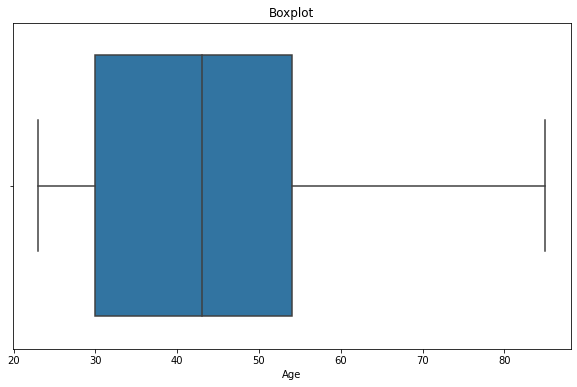

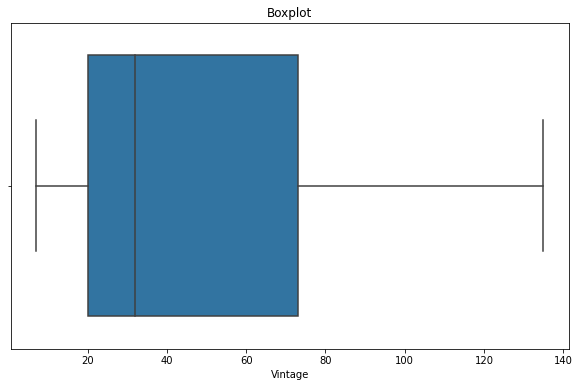

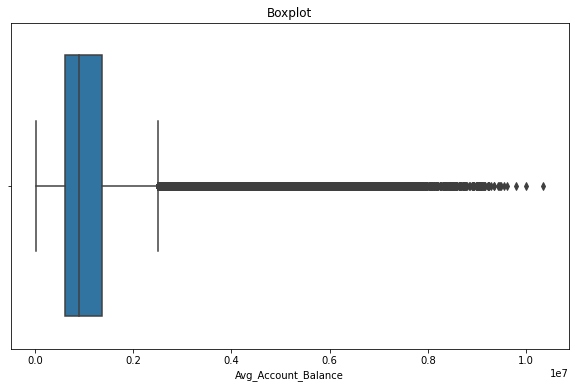

In [138]:
#Visualize the numeric variables (Boxplot)
num_col=train.select_dtypes(include=[np.number]).columns
num_cols=[n for n in num_col if n not in ['Is_Lead']]
 
for n in num_cols:
    boxplot(train[n])

The Avg_Account_Balance numeric variable has outliers. We'll find out a way to deal with this later. Let us plot the distributions of these variables.

<Figure size 720x432 with 0 Axes>

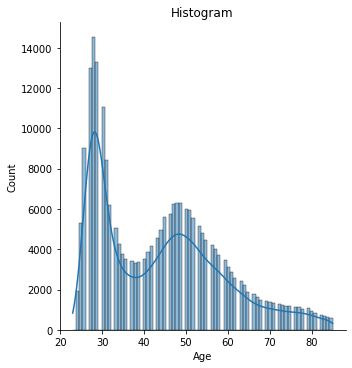

<Figure size 720x432 with 0 Axes>

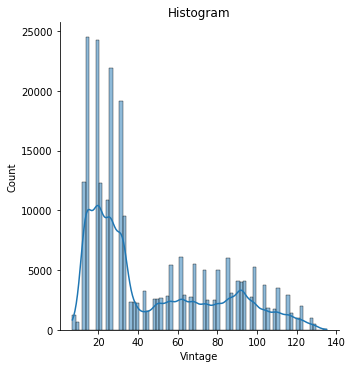

<Figure size 720x432 with 0 Axes>

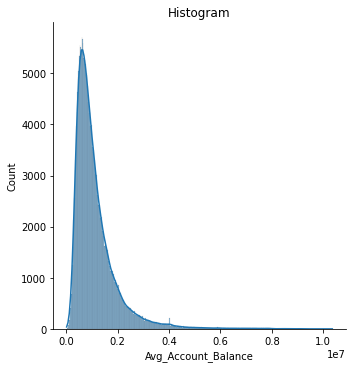

In [82]:
#Distribution of the numeric variables
for n in num_cols:
    histogram(train[n])

None of these variables are symmetric in nature. We'll apply preprocessing later. Avg_Account_Balance a long lest tail suggesting these are basically outliers. However in boosting algorithms outliers is not at all a matter of concern.

In [ ]:
#Drop outliers
#index=X[X['Avg_Account_Balance'] > 4000000].index
#X.drop(index,inplace=True)
#print(X.shape)

(219669, 9)


In [ ]:
#y.drop(index,inplace=True)
#print(y.shape)

(219669, 1)


/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
#Distribution of the numeric variables
#for n in num_cols:
    #histogram(X[n])

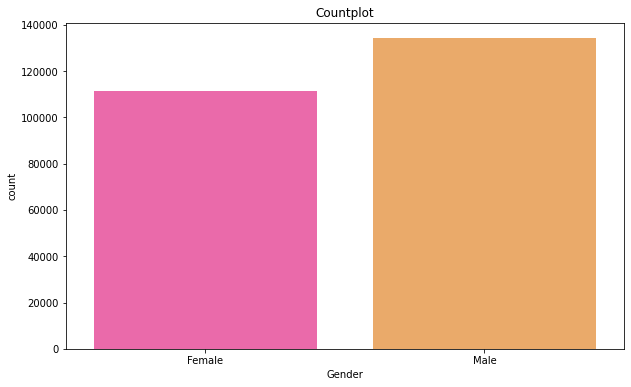

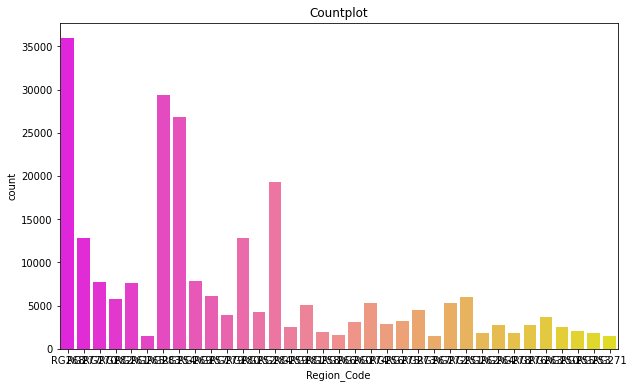

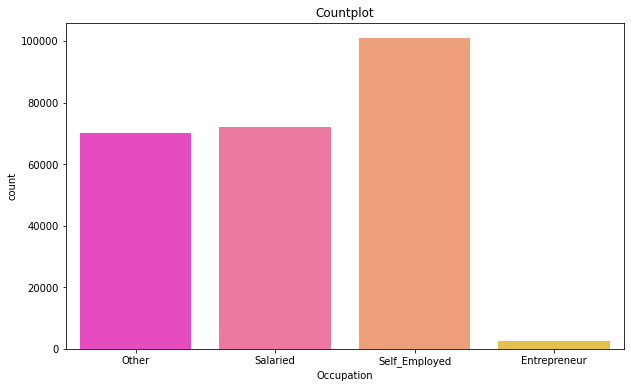

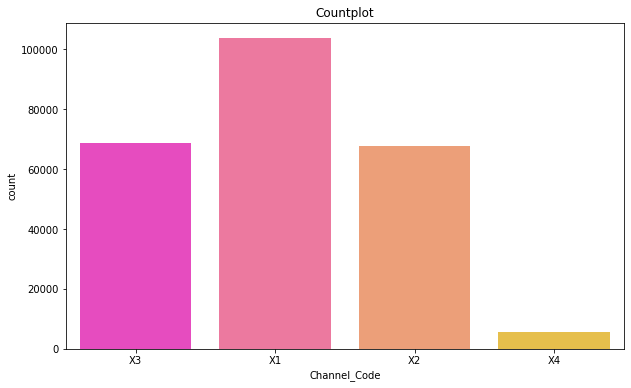

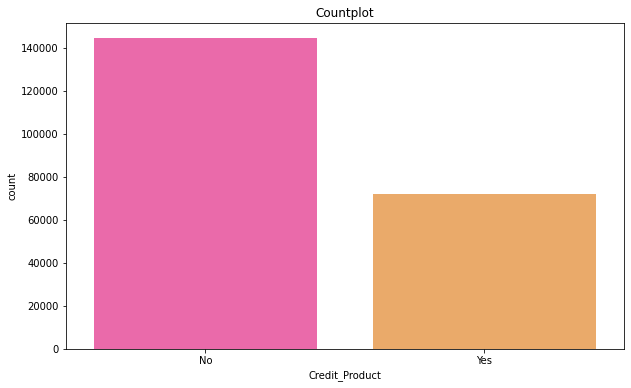

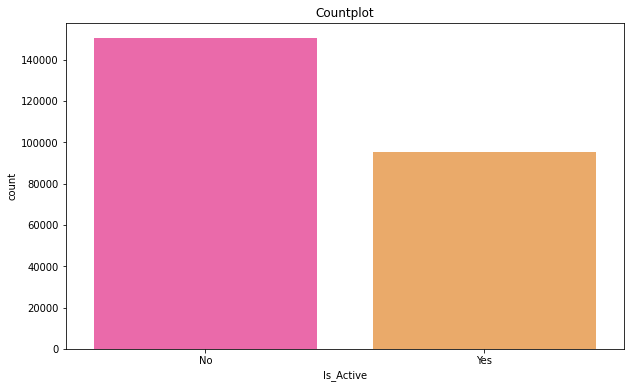

In [140]:
#Count plot of the categorical variables
cat_col=train.select_dtypes(exclude=[np.number]).columns
cat_cols=[ c for c in cat_col]

for c in cat_cols:
    countplot(train[c])

The number of males is slightly more than the number of females. Entrepreneur are very low in numbers. Most of the people are self employed. X1 ha the highest Channel_Code and X4 the least.Majority of the customers have no active Credit_Product. Finally most of the customers are not Active for the last 3 months. 

***More Feature Eng***

In [ ]:
#Median age of the Leads
train.pivot_table(values='Age',index='Is_Lead',aggfunc=np.median)

,Age
Is_Lead,
0,38
1,49


In [ ]:
#Mean age of the leads
train.pivot_table(values='Age',index='Is_Lead')

,Age
Is_Lead,
0,41.947662
1,49.993944


In [ ]:
train.groupby(['Is_Lead','Gender'])['Age'].mean()

Is_Lead  Gender
0        Female    39.604461
         Male      44.058217
1        Female    48.338956
         Male      51.049968
Name: Age, dtype: float64

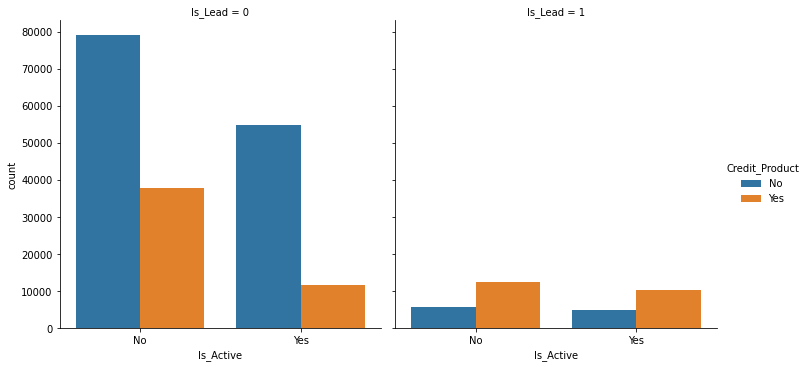

In [ ]:
sns.catplot(x='Is_Active',hue='Credit_Product',col='Is_Lead',data=train,kind='count')

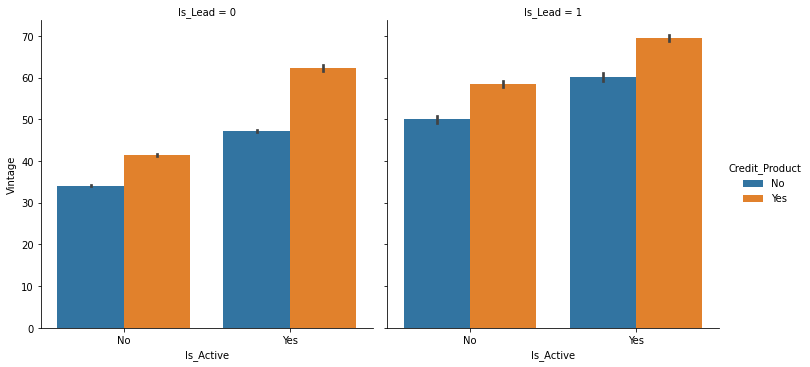

In [ ]:
sns.catplot(x='Is_Active',y='Vintage',hue='Credit_Product',col='Is_Lead',data=train,kind='bar')

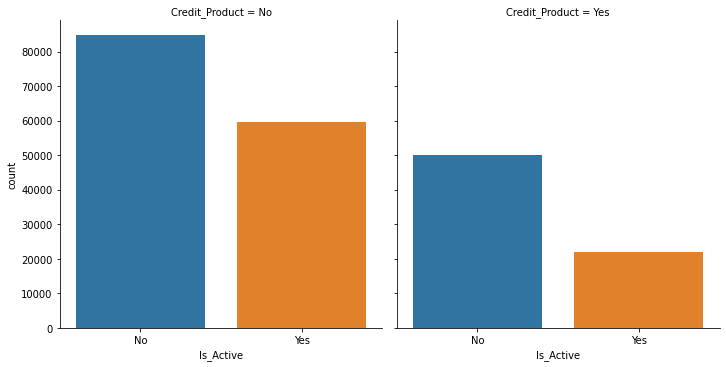

In [ ]:
sns.catplot(x='Is_Active',col='Credit_Product',data=train,kind='count')

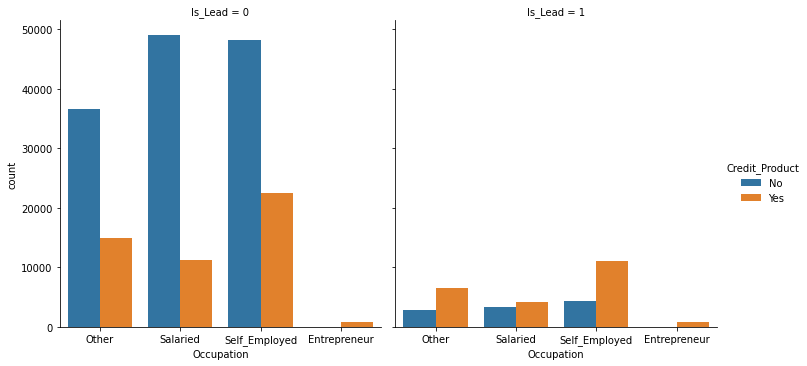

In [ ]:
sns.catplot(x='Occupation',hue='Credit_Product',col='Is_Lead',data=train,kind='count')

***Check for missing values***

In [115]:
print(train.select_dtypes(include=[np.number]).isna().sum()/len(train))
print(train.select_dtypes(exclude=[np.number]).isna().sum()/len(train))
print('************************************************')
print(test.select_dtypes(include=[np.number]).isna().sum()/len(test))
print(test.select_dtypes(exclude=[np.number]).isna().sum()/len(test))

Age                    0.0
Vintage                0.0
Avg_Account_Balance    0.0
Is_Lead                0.0
dtype: float64
Gender            0.000000
Region_Code       0.000000
Occupation        0.000000
Channel_Code      0.000000
Credit_Product    0.119341
Is_Active         0.000000
dtype: float64
************************************************
Age                    0.0
Vintage                0.0
Avg_Account_Balance    0.0
dtype: float64
Gender            0.000000
Region_Code       0.000000
Occupation        0.000000
Channel_Code      0.000000
Credit_Product    0.118904
Is_Active         0.000000
dtype: float64


The quantitative variable Credit_Product contains 0.11 % missing values in the test set and 0.11 % missing values in the training set. We'll impute them later.

***Check whether the dependent variable is balanced or not***

0    187437
1     58288
Name: Is_Lead, dtype: int64


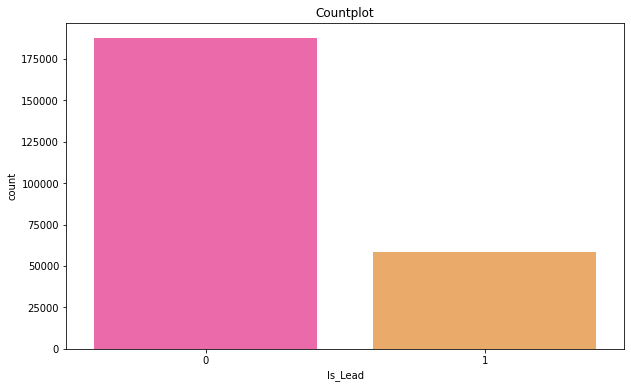

In [141]:
print(train['Is_Lead'].value_counts())
countplot(train['Is_Lead'])

The dataset is highly imbalanced. We can use SMOTE for undersampling or oversampling. . One thing to remember is to stratify while performing train test split. Here the proportion is 3.21.

***Perform Train Test split***

In [142]:
from sklearn.model_selection import train_test_split
X_train,X_valid,y_train,y_valid=train_test_split(X,y,test_size=.25,stratify=y,random_state=99)

In [87]:
print(X_train.shape, X_valid.shape)
print(y_train.value_counts())

(184293, 9) (61432, 9)
Is_Lead
0          140577
1           43716
dtype: int64


Clearly due to stratification the imbalanced nature of the dataset is maintained here. The proportion is 3.21 which is maintained.

***Apply preprocessing***

In [50]:
#Concat the two datasets
#test["Is_Lead"] = -1
#data = pd.concat([train, test]).reset_index(drop=True)

In [143]:
#Apply preprocessing to the numeric variables

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import KBinsDiscretizer
from scipy import stats

#Box-Cox transformation
#fitted_data, fitted_lambda = stats.boxcox(np.abs(X_train['Vintage']))
#X_train['Vintage_box'] = fitted_data
#fitted_data, fitted_lambda = stats.boxcox(np.abs(X_valid['Vintage']))
#X_valid['Vintage_box'] = fitted_data
#fitted_data, fitted_lambda = stats.boxcox(np.abs(test['Vintage']))
#test['Vintage_box'] = fitted_data

#Log transformation
for n in num_cols:
  X_train[n+'_log']=np.log(X_train[[n]])
  X_valid[n+'_log']=np.log(X_valid[[n]])
  test[n+'_log']=np.log(test[[n]])

#KB descritizer
#for n in num_cols:
    #kb=KBinsDiscretizer(n_bins=8, encode='ordinal', strategy='quantile')
    #X_train[n+'_quant']=kb.fit_transform(X_train[[n]])
    #X_valid[n+'_quant']=kb.transform(X_valid[[n]])
    #test[n+'_quant']=kb.transform(test[[n]]) 

#Age column Discretizer
#kb=KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='kmeans')
#X_train['Age_k']=kb.fit_transform(X_train['Age'].values.reshape(-1,1)).astype(int)
#X_valid['Age_k']=kb.transform(X_valid['Age'].values.reshape(-1,1)).astype(int)
#test['Age_k']=kb.transform(test['Age'].values.reshape(-1,1)).astype(int)


<Figure size 720x432 with 0 Axes>

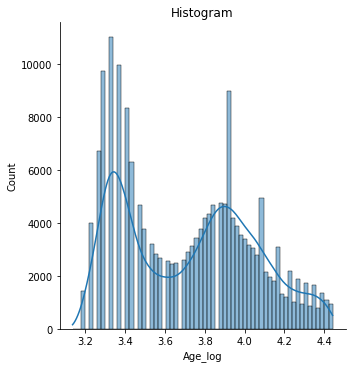

<Figure size 720x432 with 0 Axes>

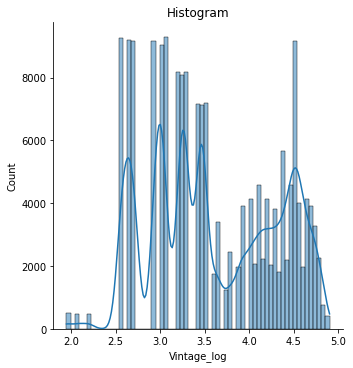

<Figure size 720x432 with 0 Axes>

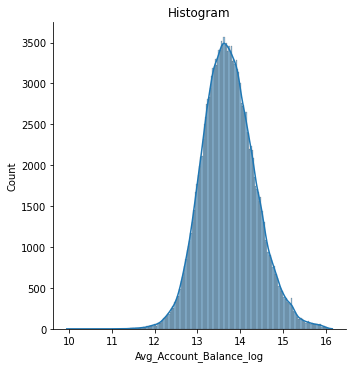

In [90]:
#Distribution of the numeric variables
dis_col=['Age_log','Vintage_log','Avg_Account_Balance_log']
for n in dis_col:
    histogram(X_train[n])

In [ ]:
#print(test['Age_log'].head(n=6))

In [144]:
#Drop the unnecesary variables
#data=data.drop(['Age','Vintage','Avg_Account_Balance'],axis=1)
X_train=X_train.drop(['Age','Vintage','Avg_Account_Balance'],axis=1)
X_valid=X_valid.drop(['Age','Vintage','Avg_Account_Balance'],axis=1)
test=test.drop(['Age','Vintage','Avg_Account_Balance'],axis=1)

In [145]:
print(test.columns)

Index(['Gender', 'Region_Code', 'Occupation', 'Channel_Code', 'Credit_Product',
       'Is_Active', 'Age_log', 'Vintage_log', 'Avg_Account_Balance_log'],
      dtype='object')


In [146]:
#Preprocessing for categorical variables
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import LabelEncoder

#data=data.dropna().reset_index(drop = True)

for c in cat_cols:
    im_c=SimpleImputer(strategy='constant',fill_value='na')
    #data[c]=im_c.fit_transform(data[[c]])
    X_train[c]=im_c.fit_transform(X_train[[c]])
    X_valid[c]=im_c.transform(X_valid[[c]])
    test[c]=im_c.transform(test[[c]])

for c in cat_cols:
    oe=LabelEncoder()
    #data[c]=oe.fit_transform(data[[c]])
    X_train[c]=oe.fit_transform(X_train[[c]])
    X_valid[c]=oe.transform(X_valid[[c]])
    test[c]=oe.transform(test[[c]])

#Let us Frequency Encode the Region_Code variable
#Dict=X_train['Region_Code'].value_counts(normalize=True).to_dict()
#X_train['Region_Code'] = X_train['Region_Code'].map(Dict)
#Dict=X_valid['Region_Code'].value_counts(normalize=True).to_dict()
#X_valid['Region_Code'] = X_valid['Region_Code'].map(Dict)
#Dict= test['Region_Code'].value_counts(normalize=True).to_dict()
#test['Region_Code'] = test['Region_Code'].map(Dict)

In [147]:
#print(data.isna().sum()/len(data))
print(X_train.isna().sum()/len(X_train))
print(test.isna().sum()/len(test))

Gender                     0.0
Region_Code                0.0
Occupation                 0.0
Channel_Code               0.0
Credit_Product             0.0
Is_Active                  0.0
Age_log                    0.0
Vintage_log                0.0
Avg_Account_Balance_log    0.0
dtype: float64
Gender                     0.0
Region_Code                0.0
Occupation                 0.0
Channel_Code               0.0
Credit_Product             0.0
Is_Active                  0.0
Age_log                    0.0
Vintage_log                0.0
Avg_Account_Balance_log    0.0
dtype: float64


In [148]:
print(X_train.dtypes)
print(X_valid.columns)
#print(test.dtypes)
print(test.head(n=6))

Gender                       int64
Region_Code                  int64
Occupation                   int64
Channel_Code                 int64
Credit_Product               int64
Is_Active                    int64
Age_log                    float64
Vintage_log                float64
Avg_Account_Balance_log    float64
dtype: object
Index(['Gender', 'Region_Code', 'Occupation', 'Channel_Code', 'Credit_Product',
       'Is_Active', 'Age_log', 'Vintage_log', 'Avg_Account_Balance_log'],
      dtype='object')
          Gender  Region_Code  ...  Vintage_log  Avg_Account_Balance_log
ID                             ...                                      
VBENBARO       1            4  ...     3.218876                13.517598
CCMEWNKY       1           18  ...     3.891820                13.738129
VK3KGA9M       1           20  ...     2.639057                12.282798
TT8RPZVC       1           22  ...     3.496508                13.674028
SHQZEYTZ       0           20  ...     2.944439          

In [127]:
X_valid.to_csv('X_valid.csv',header=True,index=False)
y_valid.to_csv('y_valid.csv',header=True,index=False)
test.to_csv('test.csv',header=True,index=False)

***Split the train and test set***

In [57]:
#_train= data[data['Is_Lead'] != -1].reset_index(drop=True)
#_test= data[data['Is_Lead'] == -1].reset_index(drop=True)

In [58]:
#_test=_test.drop(['Is_Lead'],axis=1)

In [ ]:
#print(_train.shape)
#print(_test.shape)

All the missing values are gone. Also there is no data leakage. In general we'd need to convert categorical features to vectors which we have done here.

***Perform SMOTE for resampling***

In [ ]:
#y=_train[['Is_Lead']]
#X=_train.drop(['Is_Lead'],axis=1)
#print(X.shape)
#print(X.dtypes)

<class 'numpy.ndarray'>


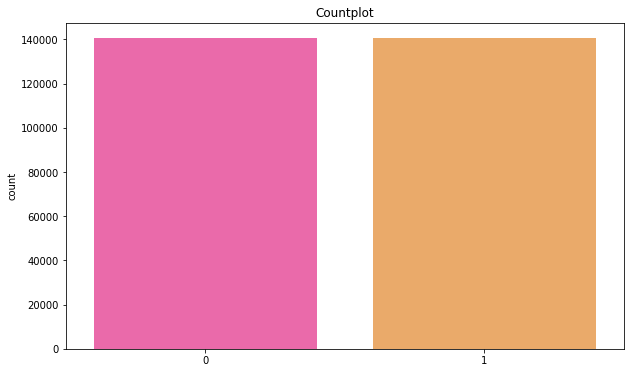

(281154, 9)


In [128]:
from imblearn.over_sampling import SMOTENC
smt=SMOTENC(categorical_features=[0,1,2,3,4,5],random_state=99)
X_res,y_res=smt.fit_resample(X_train,y_train)
print(type(X_res))
countplot(y_res)
print(X_res.shape)

In [ ]:
print(X_res)

In [130]:
coll=[x for x in X_train.columns]
print(coll)

['Gender', 'Region_Code', 'Occupation', 'Channel_Code', 'Credit_Product', 'Is_Active', 'Age_log', 'Vintage_log', 'Avg_Account_Balance_log']


In [131]:
X_res_tf=pd.DataFrame(X_res,columns=['Gender', 'Region_Code', 'Occupation', 'Channel_Code', 'Credit_Product', 'Is_Active', 'Age_log', 'Vintage_log', 'Avg_Account_Balance_log'])
X_res_tf.to_csv('X_res_tf.csv',header=True,index=False)

In [133]:
y_res_tf=pd.DataFrame(y_res,columns=['Is_Lead'])
y_res_tf.to_csv('y_res_tf.csv',header=True,index=False)

In [134]:
print(X_res_tf.shape)
print(y_res_tf.shape)

(281154, 9)
(281154, 1)


***Load the datasets after downloading when kernel is restarted***

In [12]:
X_res_df=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/X_res_tf.csv')
y_res_df=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/y_res_tf.csv')
X_valid=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/X_valid.csv')
y_valid=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/y_valid.csv')
test=pd.read_csv('/content/drive/MyDrive/Data/Jobathon2/test.csv')

In [13]:
print(X_res_df.shape)
print(y_res_df.shape)
print(X_valid.isna().sum())
print(test.isna().sum())

(281154, 9)
(281154, 1)
Gender                     0
Region_Code                0
Occupation                 0
Channel_Code               0
Credit_Product             0
Is_Active                  0
Age_log                    0
Vintage_log                0
Avg_Account_Balance_log    0
dtype: int64
Gender                     0
Region_Code                0
Occupation                 0
Channel_Code               0
Credit_Product             0
Is_Active                  0
Age_log                    0
Vintage_log                0
Avg_Account_Balance_log    0
dtype: int64


***StratifiedKfold setup***

In [11]:
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import roc_auc_score

def cross_val(X_res_df,y_res_df,model,params,folds=9):

    skf=StratifiedKFold(n_splits=folds,shuffle=True,random_state=99)
    for fold, (train_idx, test_idx) in enumerate(skf.split(X_res_df, y_res_df)):
        print(f"Fold: {fold}")
        x_train,y_train= X_res_df.iloc[train_idx], y_res_df.iloc[train_idx]
        x_test,y_test= X_res_df.iloc[test_idx], y_res_df.iloc[test_idx]

        alg = model(**params)
        alg.fit(x_train, y_train,eval_set=[(x_test, y_test)],early_stopping_rounds=1000,
                verbose=400)

        pred = alg.predict_proba(x_test)[:,1]
        roc_score = roc_auc_score(y_test, pred)
        print(f"roc_auc_score: {roc_score}")
        print("-"*50)
    
    return alg

***Modeling using catBoostClassifier***

CatBoost is just magic. The hyperparameter one_hot_max_size is the maximun vector size that we have. The column Region_Code has the maximun unique value 35. We'll use this. Class_weight is the hyperparameter for imbalanced data. For further reference about it's extensive use check the documentation.

In [14]:
pip install catboost

In [15]:
from catboost import CatBoostClassifier,Pool,cv
import timeit
from google.colab import files

new_cat_col=X_res_df.select_dtypes(exclude=[np.number]).columns
new_cat_cols=[c for c in new_cat_col]

cat_features = [X_res_df.columns.get_loc(col) for col in new_cat_cols]
print(cat_features)

train_x=Pool(data=X_res_df,label=y_res_df,cat_features=cat_features)
valid_x=Pool(data=X_valid,label=y_valid,cat_features=cat_features)
test_x=Pool(data=test,cat_features=cat_features)

def train_on_gpu(): 
  params = {'loss_function':'Logloss',
          'learning_rate':0.003,
          'depth':4,
          'l2_leaf_reg': 10.12,
          'n_estimators':100000,
          'eval_metric':'AUC',
          'od_type': 'Iter',
          'od_wait':1000,
          'verbose':200,
          'one_hot_max_size':0,
          #'class_weights':(1,3.21),
          'random_state':99,
          'task_type':'GPU'} 
  cb=CatBoostClassifier(**params)
  
  cb.fit(train_x,eval_set=valid_x,use_best_model=True,plot=True)
  pred=cb.predict_proba(test_x)[:,1]
  pred_df=pd.DataFrame(pred,columns=['Is_Lead'])
  print(pred_df.head(n=6))
  submission=pd.concat([sub['ID'],pred_df['Is_Lead']],axis=1)
  submission.to_csv('submission5.csv',header=True,index=False)
  files.download("submission5.csv");     
      
gpu_time = timeit.timeit('train_on_gpu()', 
                         setup="from __main__ import train_on_gpu", 
                         number=1)

[]


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8567910	test: 0.8550964	best: 0.8550964 (0)	total: 24.7ms	remaining: 41m 7s
200:	learn: 0.8629978	test: 0.8605663	best: 0.8605663 (200)	total: 4.89s	remaining: 40m 26s
400:	learn: 0.8727876	test: 0.8627811	best: 0.8627811 (400)	total: 9.36s	remaining: 38m 44s
600:	learn: 0.8775028	test: 0.8645318	best: 0.8645504 (577)	total: 13.8s	remaining: 38m 10s
800:	learn: 0.8835770	test: 0.8663894	best: 0.8663894 (800)	total: 18.3s	remaining: 37m 41s
1000:	learn: 0.8888110	test: 0.8673192	best: 0.8673535 (983)	total: 22.8s	remaining: 37m 31s
1200:	learn: 0.8932911	test: 0.8676721	best: 0.8676794 (1185)	total: 27.2s	remaining: 37m 18s
1400:	learn: 0.8980477	test: 0.8683155	best: 0.8683155 (1400)	total: 31.8s	remaining: 37m 21s
1600:	learn: 0.9024616	test: 0.8690445	best: 0.8690465 (1599)	total: 36.5s	remaining: 37m 20s
1800:	learn: 0.9061161	test: 0.8695057	best: 0.8695062 (1797)	total: 41s	remaining: 37m 15s
2000:	learn: 0.9094951	test: 0.8699990	best: 0.8699991 (1999)	total: 45.8s	re

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

***Modeling using XGBoost***

In [16]:
import xgboost as xgb
#train_data=xgb.DMatrix(data=X_res_tf,label=y_res_tf)
#valid_data=xgb.DMatrix(data=X_valid,label=y_valid)
#test_data=xgb.DMatrix(data=test)

NameError: ignored

In [ ]:
#Define the parameters and perform xgboost classifier
params={'objective':'binary:logistic',
        'booster':'gbtree',
        'n_estimators':100000,
        'learning_rate':0.001,
        'gamma': 5,
        'max_depth': 8,
        'lambda': 4,
        #'scale_pos_weight':3.22,
        'random_state':99}
xg_c=xgb.XGBClassifier(**params)
xg_c.fit(X_res_df,y_res_df,eval_set=[(X_valid,y_valid)],eval_metric=['auc'],early_stopping_rounds=1000)

[0]	validation_0-auc:0.860713
Will train until validation_0-auc hasn't improved in 1000 rounds.
[1]	validation_0-auc:0.860713
[2]	validation_0-auc:0.860713
[3]	validation_0-auc:0.860713
[4]	validation_0-auc:0.860713
[5]	validation_0-auc:0.860713
[6]	validation_0-auc:0.860713
[7]	validation_0-auc:0.860713
[8]	validation_0-auc:0.860713
[9]	validation_0-auc:0.860733
[10]	validation_0-auc:0.860732
[11]	validation_0-auc:0.860829
[12]	validation_0-auc:0.860823
[13]	validation_0-auc:0.860847
[14]	validation_0-auc:0.860858
[15]	validation_0-auc:0.861021
[16]	validation_0-auc:0.861031
[17]	validation_0-auc:0.861099
[18]	validation_0-auc:0.861115
[19]	validation_0-auc:0.86116
[20]	validation_0-auc:0.861114
[21]	validation_0-auc:0.861084
[22]	validation_0-auc:0.861076
[23]	validation_0-auc:0.861076
[24]	validation_0-auc:0.861088
[25]	validation_0-auc:0.861085
[26]	validation_0-auc:0.861088
[27]	validation_0-auc:0.861116
[28]	validation_0-auc:0.861113
[29]	validation_0-auc:0.861121
[30]	validation

In [ ]:
#Define the parameters and hyperparameter tuning
from sklearn.model_selection import GridSearchCV
params={
        'n_estimators':[10000],
        'learning_rate':[0.03,0.1,0.003],
        'gamma':[3,4,5],
        'max_depth':[8,100,10],
        'lambda':[4,5],
        'subsample': [0.3, 0.5, 0.9],
        }
xg_c=xgb.XGBClassifier(objective='binary:logistic',booster='gbtree',scale_pos_weight=3.22,
        random_state=99)
grid_mse = GridSearchCV(estimator=xg_c,param_grid=params,scoring='roc_auc',refit=True,
                        cv=4,verbose=1,n_jobs=2)
grid_mse.fit(X_train,np.ravel(y_train))
print("Best parameters found: ",grid_mse.best_params_)


***Modeling using LightGBM***



In [ ]:
cl=['Gender','Occupation','Channel_Code','Credit_Product','Is_Active']
for c in cl:
    oe=OrdinalEncoder(dtype=int)
    X_train[c]=oe.fit_transform(X_train[[c]])
    X_valid[c]=oe.transform(X_valid[[c]])
    test[c]=oe.transform(test[[c]])


In [ ]:
# build the lightgbm model
import lightgbm as lgb
import lightgbm
params={'n_estimators':100000,
        'boosting_type':'gbdt',
        'learning_rate': .003,
        #'scale_pos_weight':3.22,
        'min_data_in_leaf': 100,
        'max_bin': 94,
        'num_leaves': 10, 
        'max_depth': 27, 
        'reg_alpha': 8.457, 
        'reg_lambda': 6.853, 
        'subsample': 0.749}
callback=lightgbm.early_stopping(1000,verbose=True)
clf = lgb.LGBMClassifier(**params)
clf.fit(X_train,y_train,eval_set=(X_res_df,y_valid),eval_metric='auc',early_stopping_rounds=1000)